In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from more_itertools import flatten
%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
from dhdrnet.util import ROOT_DIR
data_dir = ROOT_DIR / "precomputed_data"
figdir = ROOT_DIR / "figures" / "ev_choices" / "ev_correct_2020-07-06"
figdir.mkdir(parents=True, exist_ok=True)
plt.rcParams['figure.figsize'] = (10,10)

In [3]:
df = (
    pd.read_csv(
        data_dir / "store_finer_2020-07-06.csv",
        usecols=["name", "metric", "score", "ev1", "ev2"],
    )
    .set_index("name")
#     .sample(frac=0.1)
    .sort_index()
)
df

,metric,ev1,ev2,score
name,,,,
0006_20160721_163256_525,mse,-1.75,5.50,3530.873120
0006_20160721_163256_525,mse,-2.00,1.00,97.301829
0006_20160721_163256_525,perceptual,-2.00,0.75,0.050510
0006_20160721_163256_525,ssim,-2.00,0.75,0.972899
0006_20160721_163256_525,mse,-2.00,0.75,125.067218
...,...,...,...,...
synthetic_ramp_night_motion_blur,ssim,-0.75,3.25,0.815811
synthetic_ramp_night_motion_blur,mse,-0.75,3.25,2290.742485
synthetic_ramp_night_motion_blur,perceptual,-0.75,3.00,0.200098


### prepare data, set index to the names, group by metric, clean

In [4]:
bdf = df[(df["ev1"] == 0) | (df["ev2"] == 0)].copy()
bdf["ev"] = bdf[["ev1","ev2"]].apply(lambda evs: [ev for ev in evs if ev != 0][0],axis=1)
bdf = bdf.drop(columns=["ev1", "ev2"])
bdf

,metric,score,ev
name,,,
0006_20160721_163256_525,perceptual,0.069641,-2.00
0006_20160721_163256_525,ssim,0.930313,-2.00
0006_20160721_163256_525,mse,722.200191,-2.00
0006_20160721_163256_525,perceptual,0.070193,-2.25
0006_20160721_163256_525,ssim,0.930018,-2.25
...,...,...,...
synthetic_ramp_night_motion_blur,ssim,0.754003,-1.00
synthetic_ramp_night_motion_blur,mse,4658.723790,-1.00
synthetic_ramp_night_motion_blur,perceptual,0.235918,-0.50


In [5]:
evdf = df.copy()
df["ev"] = df[["ev1", "ev2"]].apply(lambda df: tuple(sorted(df)), axis=1)
df = df.drop(["ev1", "ev2"],axis=1)
dfg = df.groupby("metric")

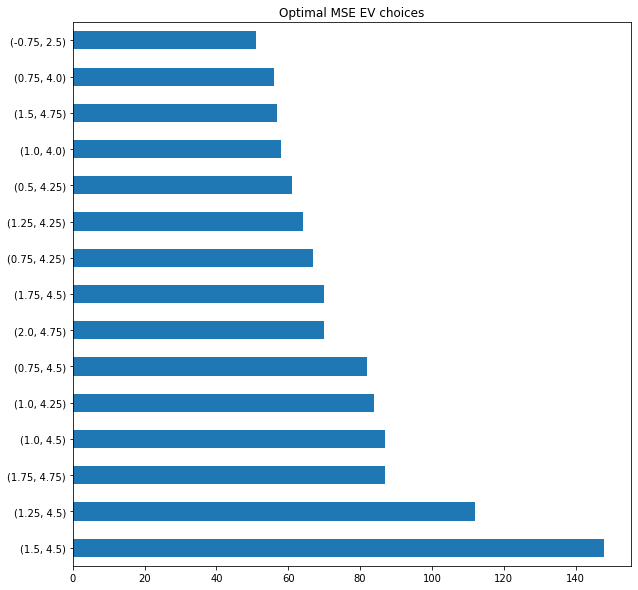

In [6]:
mse_df = dfg.get_group("mse").drop("metric",axis=1)
mse_mins = mse_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
mse_mins.value_counts().iloc[:15].plot.barh(title="Optimal MSE EV choices")
# plt.savefig(figdir / "optimal_mse_ev_corrected")

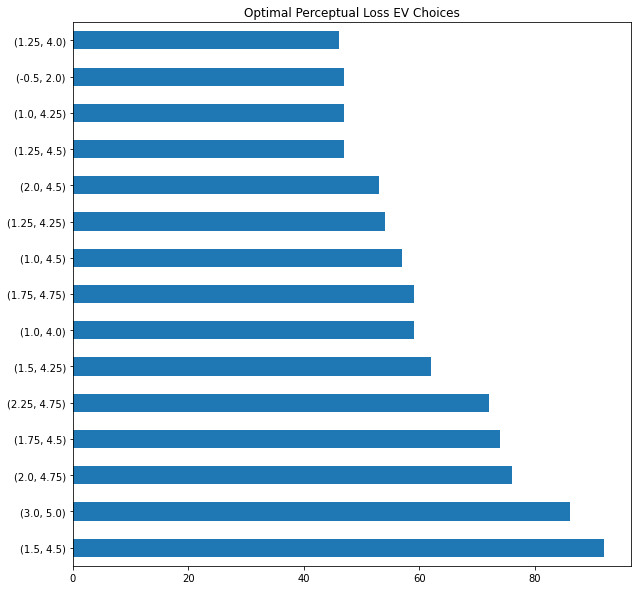

In [7]:
perc_df = dfg.get_group("perceptual").drop(columns="metric")
perc_mins = perc_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
perc_mins.value_counts().iloc[:15].plot.barh(title="Optimal Perceptual Loss EV Choices")

# plt.savefig(figdir / "optimal_perceptual_ev_corrected")

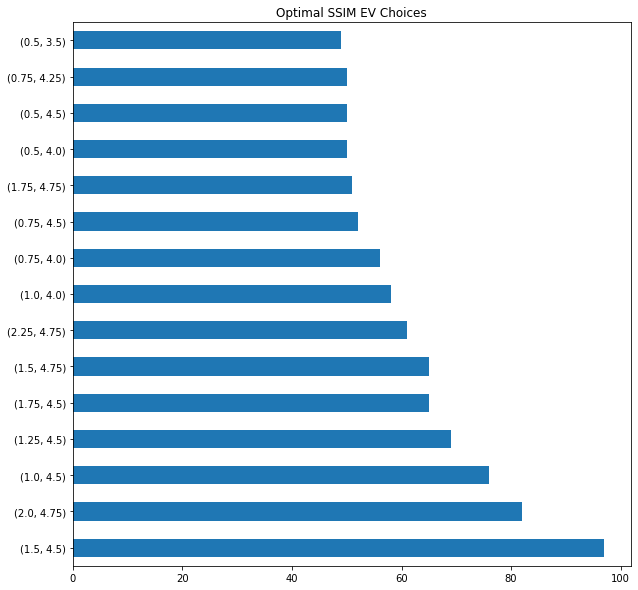

In [8]:
ssim_df = dfg.get_group("ssim").drop(columns="metric").copy()
ssim_df["score"] = 1 - ssim_df["score"]
ssim_mins = ssim_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
ssim_mins.value_counts().iloc[:15].plot.barh(title="Optimal SSIM EV Choices")
# plt.savefig(figdir / "optimal_ssim_ev_corrected")

# Baseline EV 0 

In [9]:
bdfg = bdf.groupby("metric")

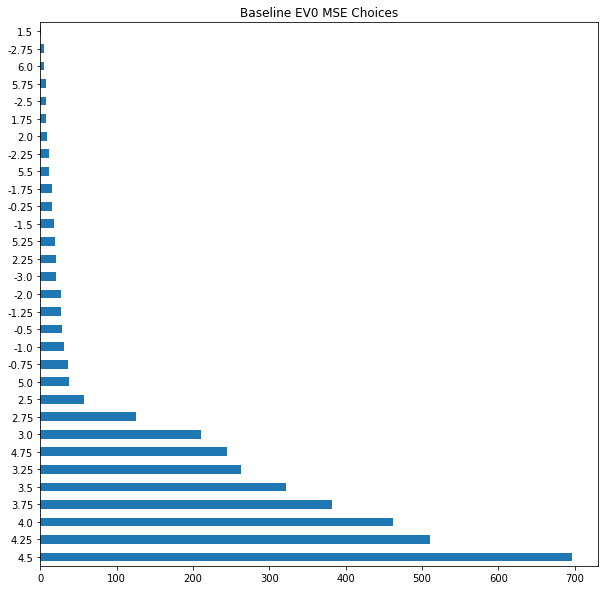

In [10]:
bmse_df = bdfg.get_group("mse").drop(columns="metric")
bmse_mins = bmse_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bmse_mins.value_counts().plot.barh(title="Baseline EV0 MSE Choices")

# plt.savefig(figdir / "baseline_mse_ev_corrected")

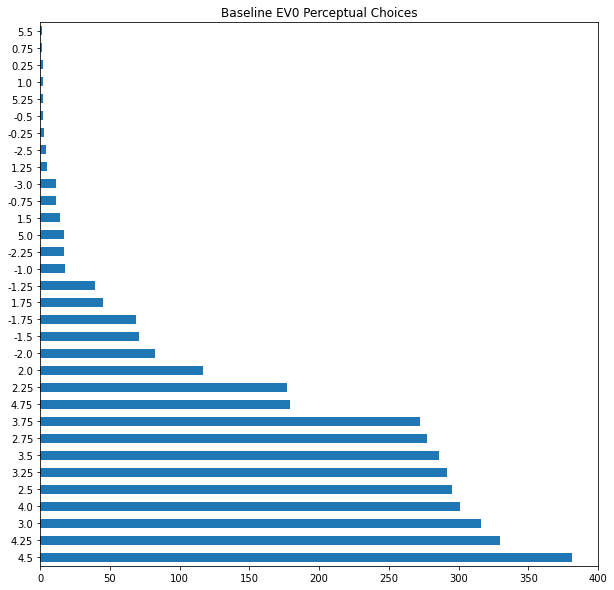

In [11]:
bperc_df = bdfg.get_group("perceptual").drop(columns="metric")
bperc_mins = bperc_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bperc_mins.value_counts().plot.barh(title="Baseline EV0 Perceptual Choices")

# plt.savefig(figdir / "baseline_perceptual_ev_corrected")

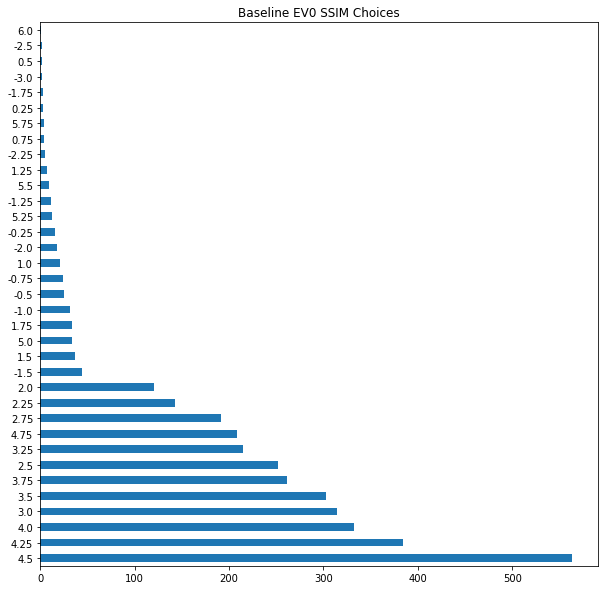

In [12]:
bssim_df = bdfg.get_group("ssim").drop(columns="metric").copy()
bssim_df["score"] = 1 - bssim_df["score"]
bssim_mins = bssim_df.pivot(columns="ev").idxmin(axis=1).apply(lambda f: f[1])
bssim_mins.value_counts().plot.barh(title="Baseline EV0 SSIM Choices")

# plt.savefig(figdir / "baseline_ssim_ev_corrected")

### Take a look at some of the best results for each metric

All Pairings First

Best according to MSE

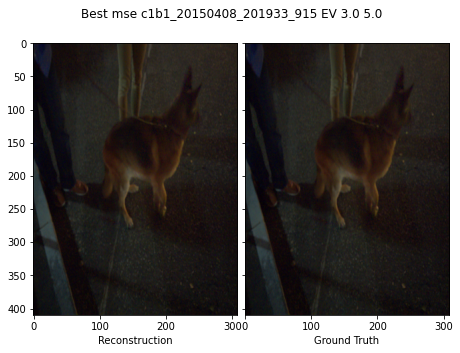

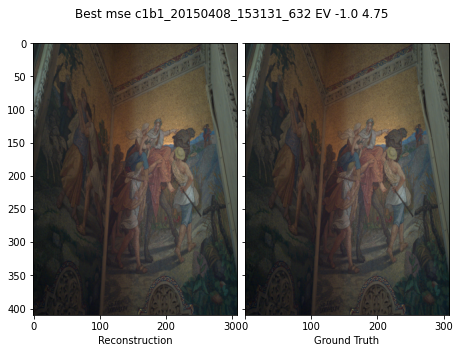

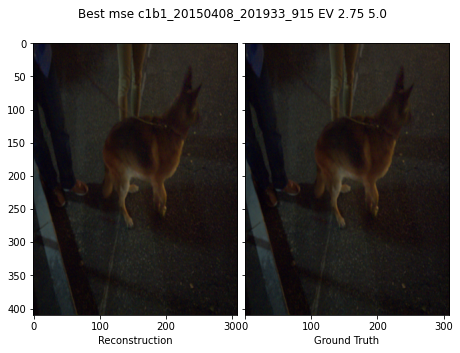

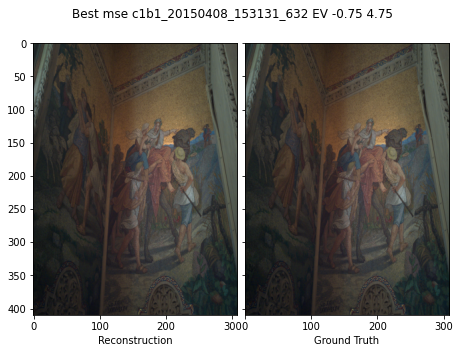

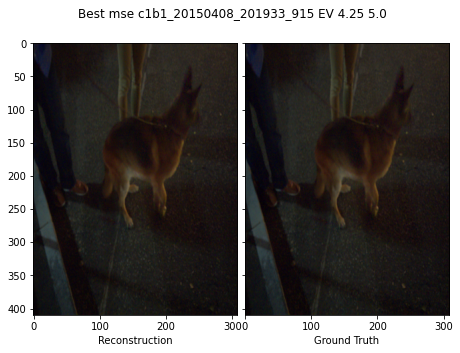

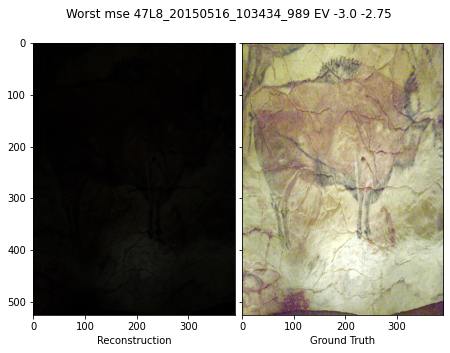

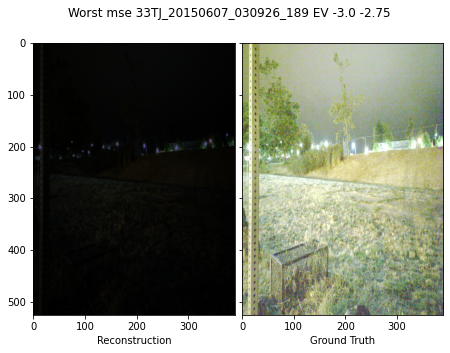

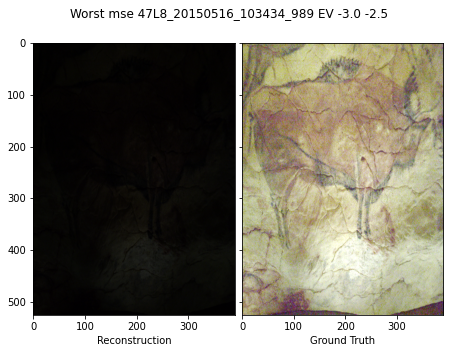

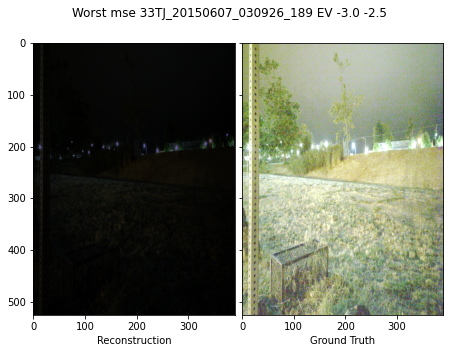

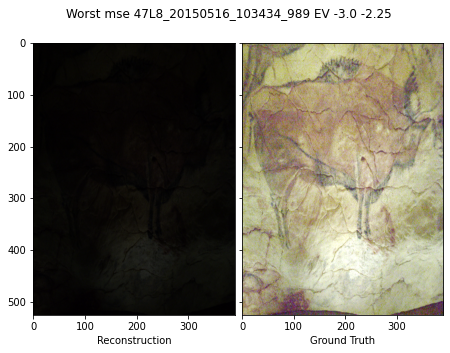

In [13]:
from dhdrnet.util import best_worse_metric

best_worse_metric(dfg, "mse", n=5)

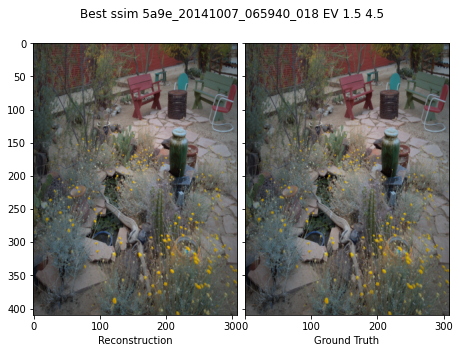

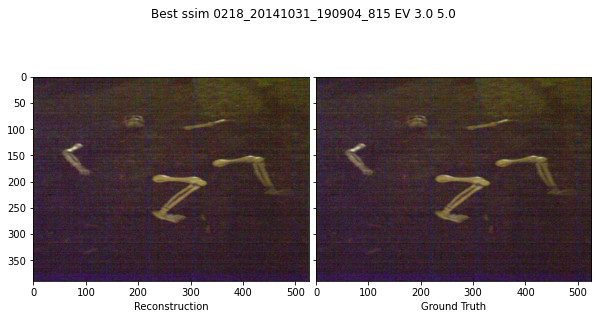

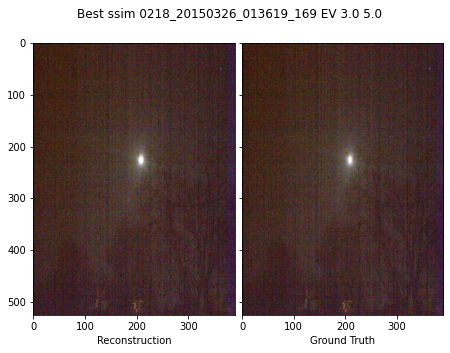

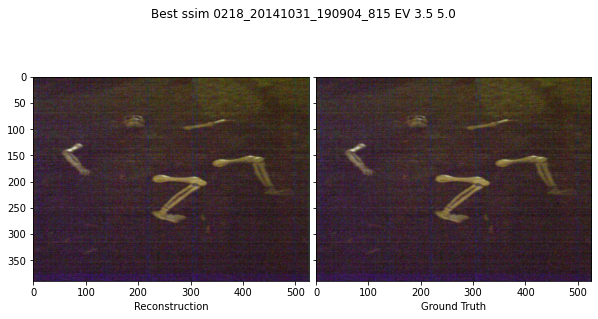

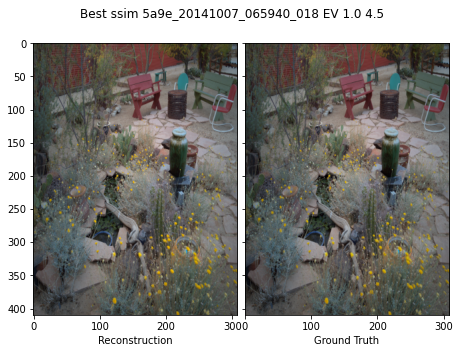

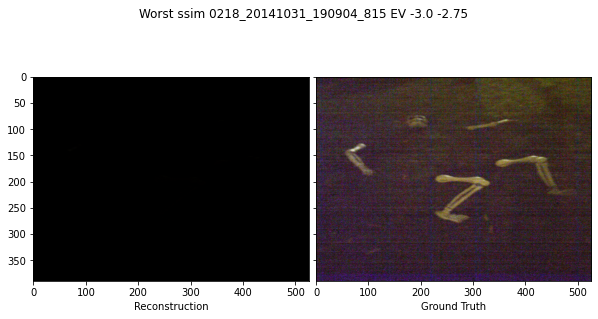

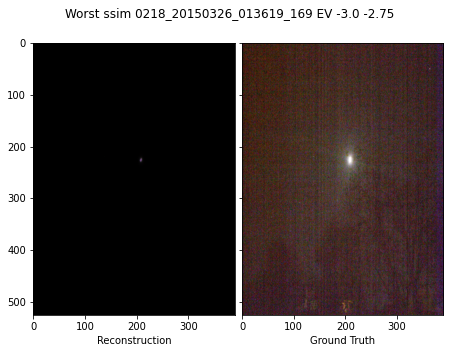

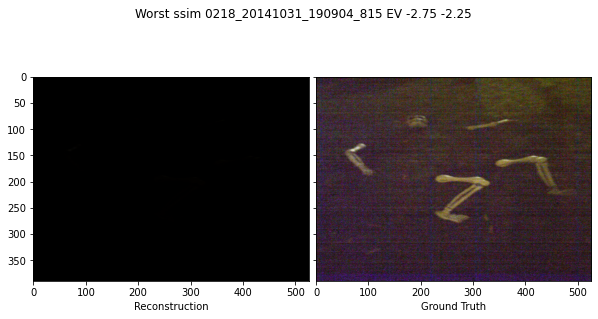

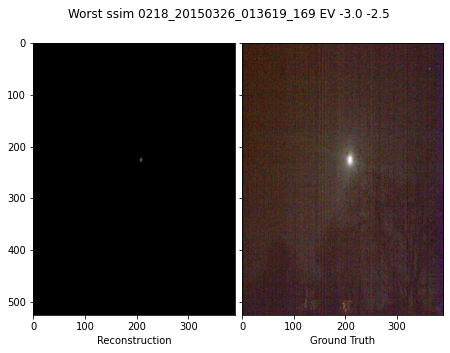

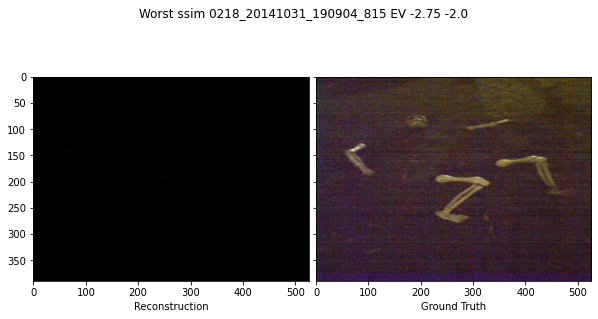

In [14]:
best_worse_metric(dfg, "ssim", n=5, save_path=figdir)

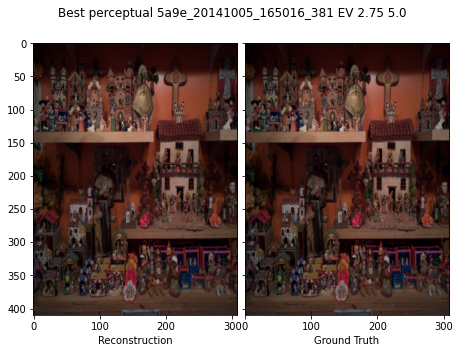

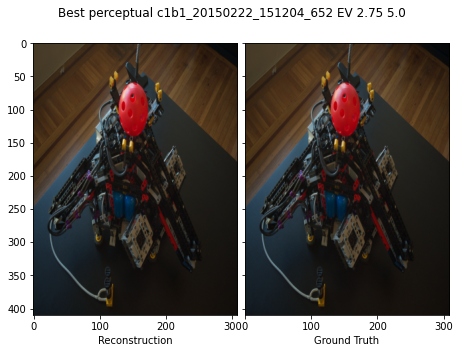

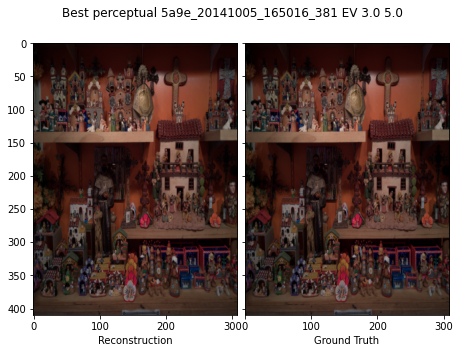

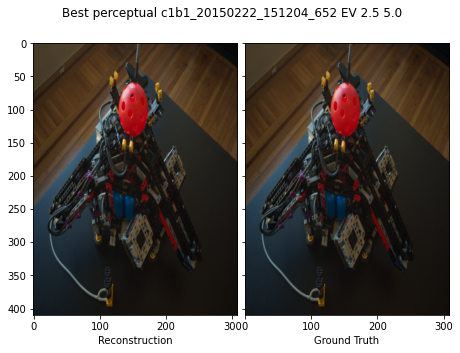

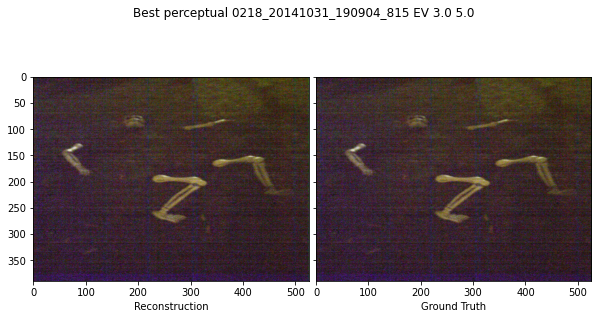

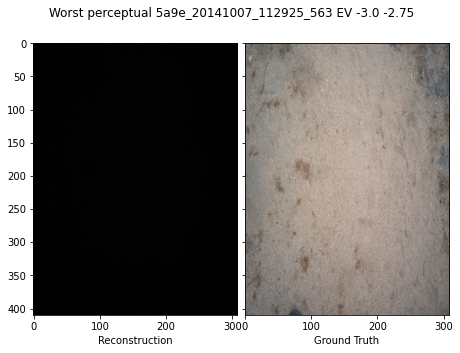

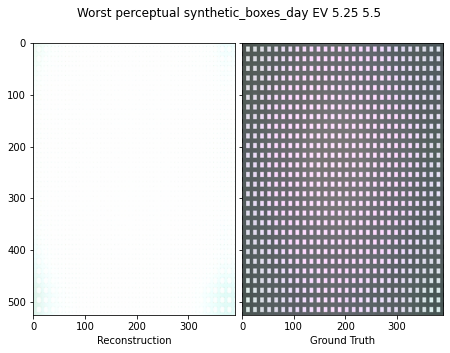

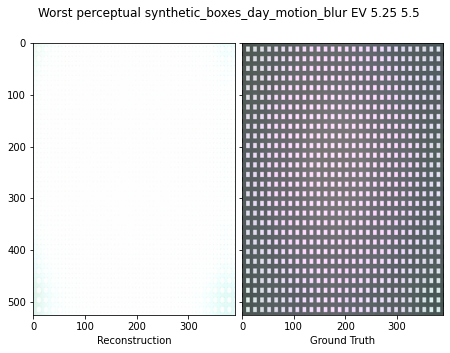

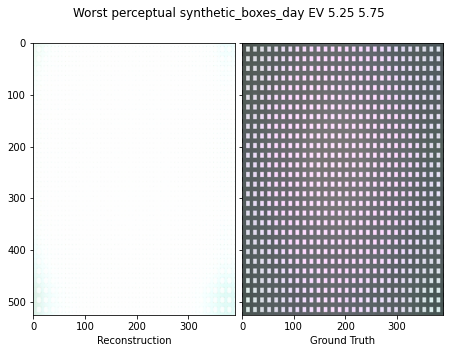

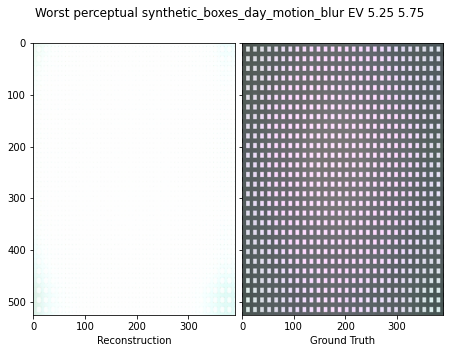

In [15]:
best_worse_metric(dfg, "perceptual", n=5, save_path=figdir)

/home/shane/Development/DHDRNet/dhdrnet/util.py:230: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(10, 5))


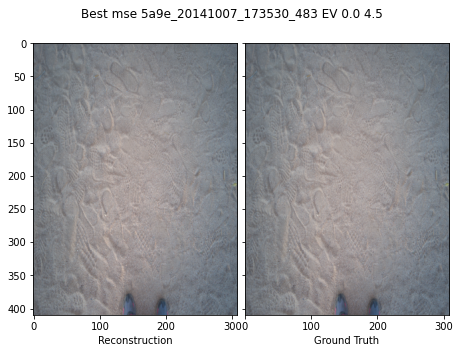

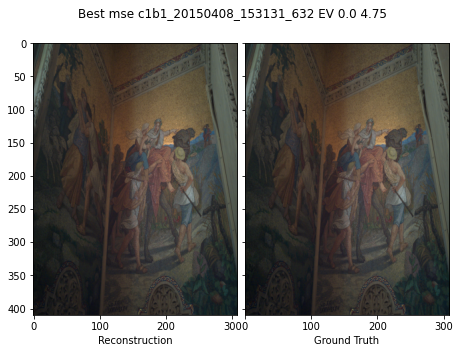

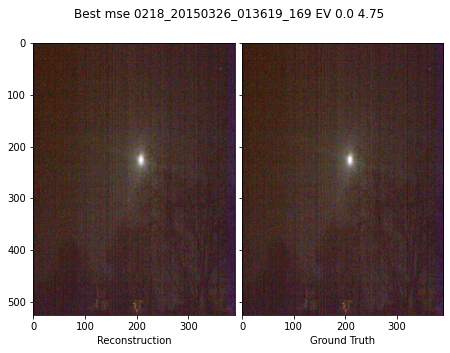

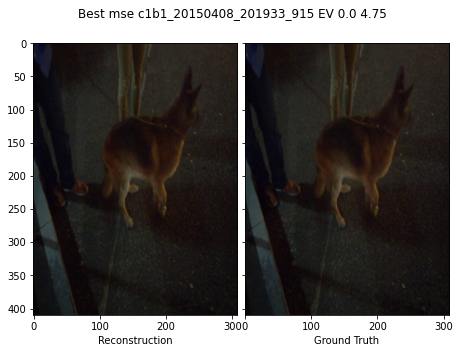

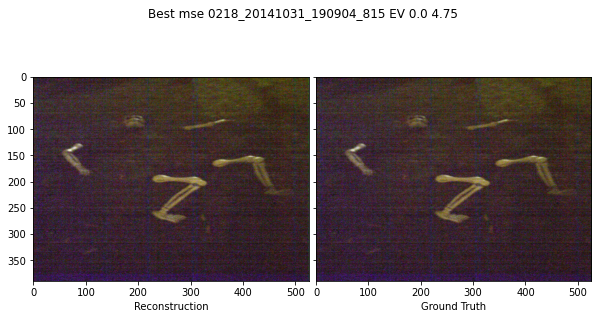

...

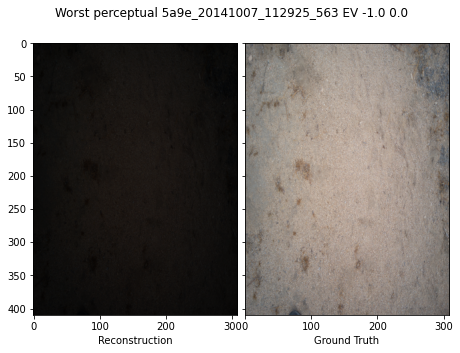

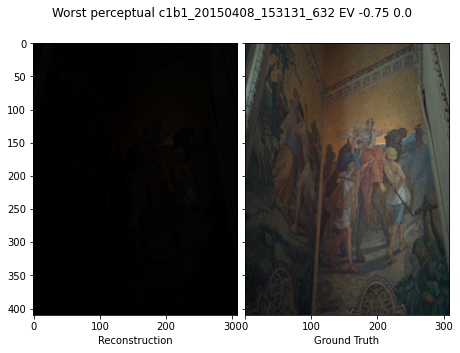

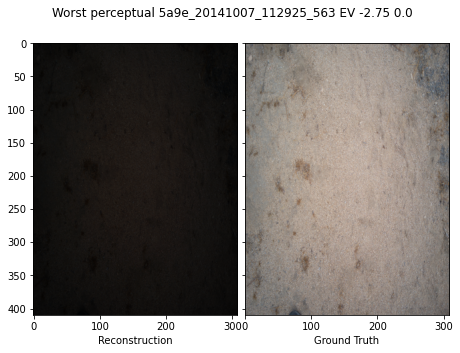

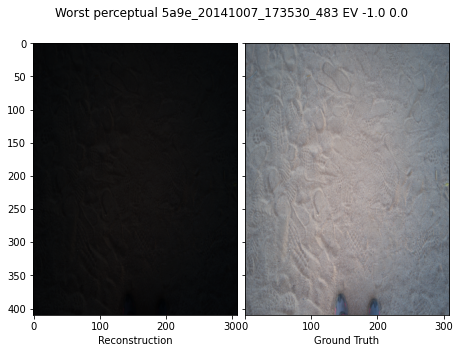

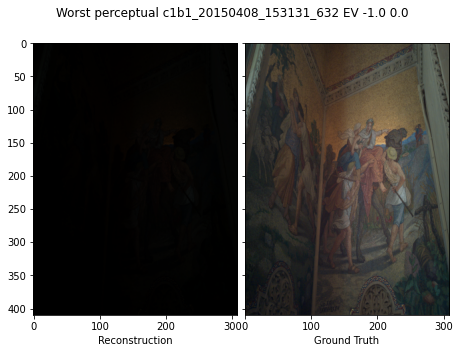

In [17]:
for metric in ["mse", "ssim", "perceptual"]:
    best_worse_metric(bdfg, metric, n=5)

In [ ]:
bdf